In [148]:
"""
from tikzplotlib import write_tikz

write_tikz(louvain_graph, "graph_tikz.tex", caption="An example of a complete graph with 5 nodes.", theme="default")
"""

'\nfrom tikzplotlib import write_tikz\n\nwrite_tikz(louvain_graph, "graph_tikz.tex", caption="An example of a complete graph with 5 nodes.", theme="default")\n'

In [280]:
import geopandas as gpd
import networkx as nx
from importlib import reload
import pandas as pd
pd.set_option('display.float_format', '{:.2f}'.format)

import lib.utils as utils
reload(utils)
import lib.scoring as scoring
reload(scoring)
import lib.gnn as gnn
reload(gnn)
import lib.property_weights as weights
reload(weights)
import lib.algorithms as algorithms
reload(algorithms)
import lib.simulation as sim
reload(sim)

<module 'lib.simulation' from '/Users/hugoschwabe/Documents/Code/bachelor-thesis/lib/simulation.py'>

In [292]:
utils.write_gml(importance_graph, "graphs/importance_removal.gml")

NetworkXError: 'IC_PO00-OUT' is not a valid key

# Initialize NUTS Regions

In [156]:
nuts3 = gpd.read_file("./data//NUTS3/NUTS_RG_20M_2024_4326.shp").set_index("NUTS_ID")
nuts3 = nuts3[nuts3["LEVL_CODE"] == 3]
nuts3 = nuts3.to_crs("EPSG:4326")
nuts3 = nuts3.reset_index()
nuts3.head(3)

,NUTS_ID,LEVL_CODE,CNTR_CODE,NAME_LATN,NUTS_NAME,MOUNT_TYPE,URBN_TYPE,COAST_TYPE,geometry
0,AL011,3,AL,Dibër,Dibër,NaN,NaN,NaN,"POLYGON ((20.2208 41.86937, 20.56287 41.84614,..."
1,AL012,3,AL,Durrës,Durrës,NaN,NaN,NaN,"POLYGON ((19.55733 41.57767, 19.83218 41.56823..."
2,AL013,3,AL,Kukës,Kukës,NaN,NaN,NaN,"POLYGON ((20.59429 41.87733, 20.56287 41.84614..."


# Initialization

##### Process Full Graph

In [157]:
original = nx.read_gml("./data/de_cs_virtual_edge.gml")
utils.add_capacity(original)
utils.add_norm_capacity(original)
#utils.add_dummy_supply(original, throughput=5000)
utils.add_supply_from_csv(original, "./data/de_cs_virtual_edge_flow.csv", verbose=True)

Updated 'supply' attribute for 3578 nodes based on CSV data.


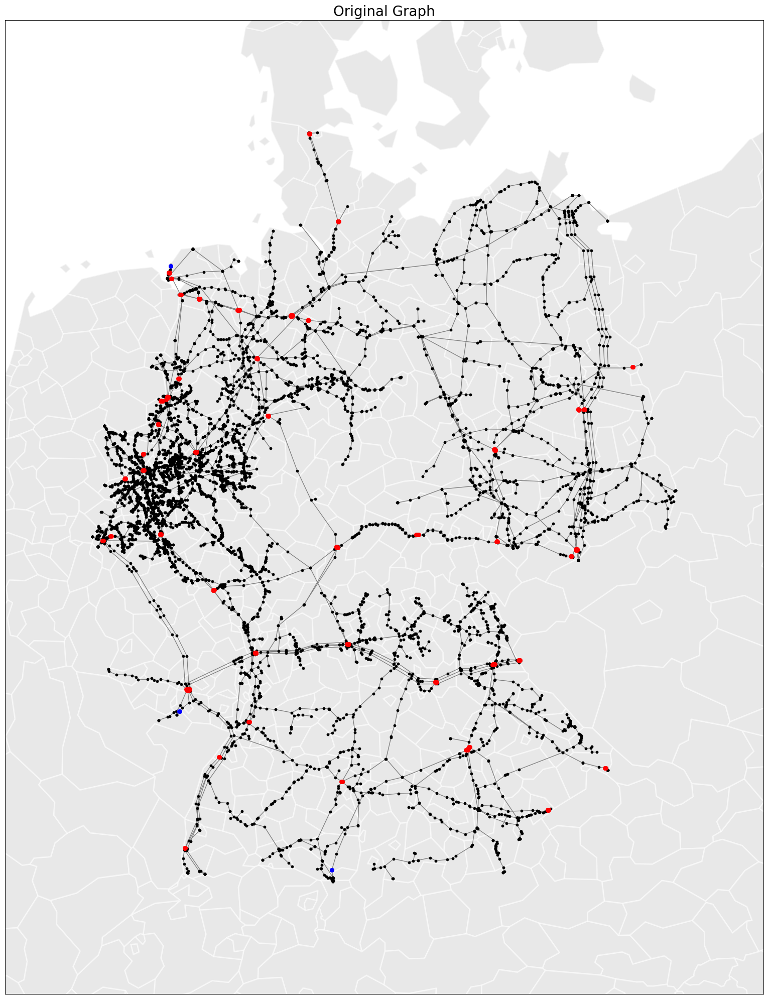

In [158]:
utils.plot_network(
	original,
	gdf=nuts3.to_crs("EPSG:3035"),
	title="Original Graph",
	nodes=False
)

##### Calculating Weights for Properties Score

In [231]:
weights.run_analysis(original)

Network has 7531 nodes and 8513 edges
Baseline Network Deliverability: 4,943.23 kg/s



N-1 Contingency Analysis: 100%|██████████| 7531/7531 [1:15:15<00:00,  1.67node/s, Node=CS08-CS-OUT, Type=CS, Drop=-0.00%]   



Analysis Complete. Returning detailed results DataFrame.
Graphs are isomorphic: False


In [248]:
property_weights = pd.read_csv("data/property_weights.csv").set_index("node_type")
property_weights = property_weights["norm_avg_importance_score"].to_dict()
property_weights

{'IC': 1.0,
 'CV': 0.1960273756837801,
 'CS': 0.1521337975136359,
 'BIO': 0.1400995989987651,
 'X': 0.0544174665024826,
 'IND': 0.0143738892158136,
 'DSO': 0.0141610748092961,
 'GPR': 0.0020140639004673,
 'LNG': 4.8362028814562204e-14,
 'ST': 9.797261539022326e-15,
 'TPP': 0.0}

# Run the Algorithms

In [249]:
original_score = scoring.score(
	original, 
	original, 
	nuts3, 
	property_weights=property_weights,
	verbose=True
)
original_score

nodes_score: 0.0
edges_score: 0.0
pre_cyclo: 983
post_cyclo: 983
cyclomatic_score: 0
complexity_score: 0.0

pdiv_score: 1.0
emd_score: 0.96176557350605
spectral_dist_score: 1.0
structure_score: 0.9872551911686833

original_regions: 341
simplified_regions: 341
regionality_score: 1.0

original_properties: 354143.51704958564
simplified_properties: 354143.51704958564
properties_score: 1.0

Original Deliverability: 4943.232812280533 kg/s
Simplified Deliverability: 4943.232812280533 kg/s
max_dev_error: 0.0
flow_score: 1.0

Overall Weighted Score: 0.7974510382337368


np.float64(0.7974510382337368)

In [250]:
utils.plot_network_pyvis(original, "Original Graph", "./plots/original.html")

./plots/original.html
Interactive graph saved to './plots/original.html'


In [251]:
"""
nodes_score: 0.0
edges_score: 0.0
pre_cyclo: 760
post_cyclo: 760
cyclomatic_score: 0
complexity_score: 0.0

ac_simplified: 0.0001178643842265943
ac_original: 0.00011786438424365008
ac_score: 0.9999999999276467
emd_score: 0.9853292048517621
spectral_dist_score: 1.0
structure_score: 0.9951097349264696

original_regions: 344
simplified_regions: 344
regionality_score: 1.0

original_properties: 6022.75
simplified_properties: 6022.75
properties_score: 1.0

Overall Score: 0.7487774337316174
"""

'\nnodes_score: 0.0\nedges_score: 0.0\npre_cyclo: 760\npost_cyclo: 760\ncyclomatic_score: 0\ncomplexity_score: 0.0\n\nac_simplified: 0.0001178643842265943\nac_original: 0.00011786438424365008\nac_score: 0.9999999999276467\nemd_score: 0.9853292048517621\nspectral_dist_score: 1.0\nstructure_score: 0.9951097349264696\n\noriginal_regions: 344\nsimplified_regions: 344\nregionality_score: 1.0\n\noriginal_properties: 6022.75\nsimplified_properties: 6022.75\nproperties_score: 1.0\n\nOverall Score: 0.7487774337316174\n'

##### Community Detection

In [252]:
greedy_modularity_results, greedy_modularity_graph = algorithms.greedy_modularity_communities(original)
greedy_modularity_score = scoring.score(
	original, 
	greedy_modularity_graph, 
	nuts3, 
	property_weights=property_weights,
	verbose=True
)
greedy_modularity_score

Gefundene Communities: 88
Modularität Q = 0.9458345014415319
nodes_score: 0.9883149648121099
edges_score: 0.9800305415247269
pre_cyclo: 983
post_cyclo: 83
cyclomatic_score: 0.9155645981688708
complexity_score: 0.9613033681685691

pdiv_score: 0.05456785429750788
emd_score: 0.6620601513354127
spectral_dist_score: 0.36961389456845545
structure_score: 0.3620806334004587

original_regions: 341
simplified_regions: 74
regionality_score: 0.21700879765395895

original_properties: 354143.51704958564
simplified_properties: 8151.801219518491
properties_score: 0.02301835506529154

Original Deliverability: 4943.232812280533 kg/s
Simplified Deliverability: 6192.13453096789 kg/s
max_dev_error: 0.25264877583444895
flow_score: 0.7473512241655511

Overall Weighted Score: 0.4621524756907659


np.float64(0.4621524756907659)

In [253]:
"""
Gefundene Communities: 88
Modularität Q = 0.9458345014415319

nodes_score: 0.9883149648121099
edges_score: 0.9800305415247269
pre_cyclo: 983
post_cyclo: 83
cyclomatic_score: 0.9155645981688708
complexity_score: 0.9613033681685691

pdiv_score: 0.051845724475907407
emd_score: 0.6654596582483985
spectral_dist_score: 0.3695533582257581
structure_score: 0.3622862469833546

original_regions: 341
simplified_regions: 74
regionality_score: 0.21700879765395895

original_properties: 428717.17167103756
simplified_properties: 8987.479023063459
properties_score: 0.020963655334896907

Original Deliverability: 4943.232812280533 kg/s
Simplified Deliverability: 6230.571237298724 kg/s
max_dev_error: 0.26042439713137533
flow_score: 0.7395756028686247

Overall Weighted Score: 0.4602275342018809
"""

'\nGefundene Communities: 88\nModularität Q = 0.9458345014415319\n\nnodes_score: 0.9883149648121099\nedges_score: 0.9800305415247269\npre_cyclo: 983\npost_cyclo: 83\ncyclomatic_score: 0.9155645981688708\ncomplexity_score: 0.9613033681685691\n\npdiv_score: 0.051845724475907407\nemd_score: 0.6654596582483985\nspectral_dist_score: 0.3695533582257581\nstructure_score: 0.3622862469833546\n\noriginal_regions: 341\nsimplified_regions: 74\nregionality_score: 0.21700879765395895\n\noriginal_properties: 428717.17167103756\nsimplified_properties: 8987.479023063459\nproperties_score: 0.020963655334896907\n\nOriginal Deliverability: 4943.232812280533 kg/s\nSimplified Deliverability: 6230.571237298724 kg/s\nmax_dev_error: 0.26042439713137533\nflow_score: 0.7395756028686247\n\nOverall Weighted Score: 0.4602275342018809\n'

In [254]:
louvain_results, louvain_graph = algorithms.louvain_communities(
	original,
	["CS", "CV", "IC"]
)
louvain_score = scoring.score(
	original, 
	louvain_graph, 
	nuts3, 
	property_weights=property_weights,
	verbose=True
)
louvain_score

Gefundene Communities: 71
Modularität Q = 0.946981750770434
nodes_score: 0.9905723011552251
edges_score: 0.9817925525666628
pre_cyclo: 983
post_cyclo: 85
cyclomatic_score: 0.91353001017294
complexity_score: 0.9619649546316094

pdiv_score: 0.05371668255185591
emd_score: 0.784281970147937
spectral_dist_score: 0.36945758705696186
structure_score: 0.40248541325225157

original_regions: 341
simplified_regions: 59
regionality_score: 0.17302052785923755

original_properties: 354143.51704958564
simplified_properties: 6927.537132536827
properties_score: 0.01956138344773614

Original Deliverability: 4943.232812280533 kg/s
Simplified Deliverability: 7002.370192904568 kg/s
max_dev_error: 0.4165568280556189
flow_score: 0.5834431719443811

Overall Weighted Score: 0.4280950902270432


np.float64(0.4280950902270432)

In [255]:
utils.plot_network_pyvis(louvain_graph, "Louvain Communities Graph", "./plots/louvain_communities.html")

./plots/louvain_communities.html
Interactive graph saved to './plots/louvain_communities.html'


In [256]:
"""
Gefundene Communities: 71
Modularität Q = 0.946981750770434
nodes_score: 0.9905723011552251
edges_score: 0.9817925525666628
pre_cyclo: 983
post_cyclo: 85
cyclomatic_score: 0.91353001017294
complexity_score: 0.9619649546316094

pdiv_score: 0.04677037456045552
emd_score: 0.7837638564078475
spectral_dist_score: 0.36941485497153087
structure_score: 0.3999830286466113

original_regions: 341
simplified_regions: 59
regionality_score: 0.17302052785923755

original_properties: 428717.17167103756
simplified_properties: 8850.856225007912
properties_score: 0.020644977178099443

Original Deliverability: 4943.232812280533 kg/s
Simplified Deliverability: 7012.682172386787 kg/s
max_dev_error: 0.41864290813192045
flow_score: 0.5813570918680795

Overall Weighted Score: 0.4273941160367275
"""

'\nGefundene Communities: 71\nModularität Q = 0.946981750770434\nnodes_score: 0.9905723011552251\nedges_score: 0.9817925525666628\npre_cyclo: 983\npost_cyclo: 85\ncyclomatic_score: 0.91353001017294\ncomplexity_score: 0.9619649546316094\n\npdiv_score: 0.04677037456045552\nemd_score: 0.7837638564078475\nspectral_dist_score: 0.36941485497153087\nstructure_score: 0.3999830286466113\n\noriginal_regions: 341\nsimplified_regions: 59\nregionality_score: 0.17302052785923755\n\noriginal_properties: 428717.17167103756\nsimplified_properties: 8850.856225007912\nproperties_score: 0.020644977178099443\n\nOriginal Deliverability: 4943.232812280533 kg/s\nSimplified Deliverability: 7012.682172386787 kg/s\nmax_dev_error: 0.41864290813192045\nflow_score: 0.5813570918680795\n\nOverall Weighted Score: 0.4273941160367275\n'

In [257]:
k_means_results, k_means_graph= algorithms.k_means(original)
k_means_score = scoring.score(
	original, 
	k_means_graph, 
	nuts3, 
	property_weights=property_weights,
	verbose=True
)
k_means_score


---> Optimal k found: 230 with score 0.4842 <---

Clustering 7531 nodes into 230 communities based on location...
Clustering complete.
Geographic Clustering Finished. Found 230 communities

nodes_score: 0.9694595671225601
edges_score: 0.9541877129096675
pre_cyclo: 983
post_cyclo: 161
cyclomatic_score: 0.8362156663275686
complexity_score: 0.9199543154532653

pdiv_score: 0.13518971628332688
emd_score: 0.8046559701148146
spectral_dist_score: 0.37288261200829625
structure_score: 0.43757609946881254

original_regions: 341
simplified_regions: 184
regionality_score: 0.5395894428152492

original_properties: 354143.51704958564
simplified_properties: 23694.72332016932
properties_score: 0.06690712149010393

Original Deliverability: 4943.232812280533 kg/s
Simplified Deliverability: 4853.342840087202 kg/s
max_dev_error: 0.01818445046124805
flow_score: 0.9818155495387519

Overall Weighted Score: 0.5891685057532366


np.float64(0.5891685057532366)

In [258]:
"""
---> Optimal k found: 230 with score 0.4842 <---

Clustering 7531 nodes into 230 communities based on location...
Clustering complete.
Geographic Clustering Finished. Found 230 communities

nodes_score: 0.9694595671225601
edges_score: 0.9541877129096675
pre_cyclo: 983
post_cyclo: 161
cyclomatic_score: 0.8362156663275686
complexity_score: 0.9199543154532653

pdiv_score: 0.15917849036345078
emd_score: 0.8165130151524018
spectral_dist_score: 0.3726038010280269
structure_score: 0.4494317688479598

original_regions: 341
simplified_regions: 184
regionality_score: 0.5395894428152492

original_properties: 428717.17167103756
simplified_properties: 30779.871658356828
properties_score: 0.07179528531218894

Original Deliverability: 4943.232812280533 kg/s
Simplified Deliverability: 6954.466562716493 kg/s
max_dev_error: 0.4068660787004464
flow_score: 0.5931339212995537

Overall Weighted Score: 0.5147809467456435
"""

'\n---> Optimal k found: 230 with score 0.4842 <---\n\nClustering 7531 nodes into 230 communities based on location...\nClustering complete.\nGeographic Clustering Finished. Found 230 communities\n\nnodes_score: 0.9694595671225601\nedges_score: 0.9541877129096675\npre_cyclo: 983\npost_cyclo: 161\ncyclomatic_score: 0.8362156663275686\ncomplexity_score: 0.9199543154532653\n\npdiv_score: 0.15917849036345078\nemd_score: 0.8165130151524018\nspectral_dist_score: 0.3726038010280269\nstructure_score: 0.4494317688479598\n\noriginal_regions: 341\nsimplified_regions: 184\nregionality_score: 0.5395894428152492\n\noriginal_properties: 428717.17167103756\nsimplified_properties: 30779.871658356828\nproperties_score: 0.07179528531218894\n\nOriginal Deliverability: 4943.232812280533 kg/s\nSimplified Deliverability: 6954.466562716493 kg/s\nmax_dev_error: 0.4068660787004464\nflow_score: 0.5931339212995537\n\nOverall Weighted Score: 0.5147809467456435\n'

##### Community Detection in Attributed Graphs

In [259]:
gnn_results, gnn_graph = algorithms.gnn_clustering(
	original,
	coord_weight=200
)
gnn_score = scoring.score(
	original, 
	gnn_graph, 
	nuts3, 
	property_weights=property_weights,
	verbose=True
)
gnn_score


--- Starting GNN Model Training ---

--- Finding Optimal Hyperparameters (k and coord_weight) ---

Testing Coordinate Weight: 0.5

Testing Coordinate Weight: 1.0

Testing Coordinate Weight: 2.0

Testing Coordinate Weight: 5.0

Testing Coordinate Weight: 10.0

---> Optimal Hyperparameters Found <---
  - Best Coordinate Weight: 0.5
  - Best Number of Clusters (k): 250
  - With Silhouette Score: 0.3415
Clustering 7531 nodes using combined features (Embeddings + Coords)...
Clustering complete.
nodes_score: 0.9668038773071306
edges_score: 0.8674967696464231
pre_cyclo: 983
post_cyclo: 879
cyclomatic_score: 0.1057985757884028
complexity_score: 0.6466997409139855

pdiv_score: 0.009841720447453128
emd_score: 0.9570332569128118
spectral_dist_score: 0.37360758472157596
structure_score: 0.44682752069394693

original_regions: 341
simplified_regions: 138
regionality_score: 0.4046920821114369

original_properties: 354143.51704958564
simplified_properties: 186465.03778635338
properties_score: 0.52652

np.float64(0.5952600700741635)

In [260]:
"""
---> Optimal Hyperparameters Found <---
  - Best Coordinate Weight: 10.0
  - Best Number of Clusters (k): 250
  - With Silhouette Score: 0.3116
Clustering 7531 nodes using combined features (Embeddings + Coords)...
Clustering complete.

nodes_score: 0.9668038773071306
edges_score: 0.8951016093034183
pre_cyclo: 983
post_cyclo: 644
cyclomatic_score: 0.34486266531027465
complexity_score: 0.735589383973608

pdiv_score: 0.050610679061865116
emd_score: 0.8529891711587044
spectral_dist_score: 0.3721992575782391
structure_score: 0.42526636926626954

original_regions: 341
simplified_regions: 143
regionality_score: 0.41935483870967744

original_properties: 428717.17167103756
simplified_properties: 49911.0174922794
properties_score: 0.1164194503750296

Original Deliverability: 4943.232812280533 kg/s
Simplified Deliverability: 6823.904408696953 kg/s
max_dev_error: 0.3804537774842903
flow_score: 0.6195462225157097

Overall Weighted Score: 0.46323525296805884
"""

'\n---> Optimal Hyperparameters Found <---\n  - Best Coordinate Weight: 10.0\n  - Best Number of Clusters (k): 250\n  - With Silhouette Score: 0.3116\nClustering 7531 nodes using combined features (Embeddings + Coords)...\nClustering complete.\n\nnodes_score: 0.9668038773071306\nedges_score: 0.8951016093034183\npre_cyclo: 983\npost_cyclo: 644\ncyclomatic_score: 0.34486266531027465\ncomplexity_score: 0.735589383973608\n\npdiv_score: 0.050610679061865116\nemd_score: 0.8529891711587044\nspectral_dist_score: 0.3721992575782391\nstructure_score: 0.42526636926626954\n\noriginal_regions: 341\nsimplified_regions: 143\nregionality_score: 0.41935483870967744\n\noriginal_properties: 428717.17167103756\nsimplified_properties: 49911.0174922794\nproperties_score: 0.1164194503750296\n\nOriginal Deliverability: 4943.232812280533 kg/s\nSimplified Deliverability: 6823.904408696953 kg/s\nmax_dev_error: 0.3804537774842903\nflow_score: 0.6195462225157097\n\nOverall Weighted Score: 0.46323525296805884\n'

##### Edge Contraction

In [264]:
k2_cores = algorithms.k_core(
	original, 
	["CS", "CV", "IC"],
	k=2
)
k2_cores_score = scoring.score(
	original, 
	k2_cores, 
	nuts3, 
	property_weights=property_weights,
	verbose=True
)
k2_cores_score

160 nodes inserted.
215 edges inserted.
Reconnecting edges for critical components (CS/CV)...
0 critical component edges re-inserted.

nodes_score: 0.321205683176205
edges_score: 0.27769294020909197
pre_cyclo: 983
post_cyclo: 1038
cyclomatic_score: 0
complexity_score: 0.19963287446176567

pdiv_score: 0.7807877089196011
emd_score: 0.96176557350605
spectral_dist_score: 0.8678365024078368
structure_score: 0.8701299282778293

original_regions: 341
simplified_regions: 288
regionality_score: 0.844574780058651

original_properties: 354143.51704958564
simplified_properties: 379396.63190046075
properties_score: 1.0

Original Deliverability: 4943.232812280533 kg/s
Simplified Deliverability: 6687.390739889508 kg/s
max_dev_error: 0.3528375040875968
flow_score: 0.6471624959124032

Overall Weighted Score: 0.71230001574213


np.float64(0.71230001574213)

In [263]:
k2_cores.nodes(data=True)

NodeDataView({})

In [ ]:
"""
Original Deliverability: 4943.232812280533 kg/s
Simplified Deliverability: 2380.0727065731294 kg/s

Original Deliverability: 4655.156968008432 kg/s
Simplified Deliverability: 3577.1170490815193 kg/s
"""

'\nOriginal Deliverability: 4943.232812280533 kg/s\nSimplified Deliverability: 2380.0727065731294 kg/s\n\nOriginal Deliverability: 4655.156968008432 kg/s\nSimplified Deliverability: 3577.1170490815193 kg/s\n'

In [ ]:
"""
p2_bar = 0.01
Original Deliverability: 4876.51 kg/s
Simplified Deliverability: 3616.34 kg/s

k_p = 0.2
Original Deliverability: 4660.01 kg/s
Simplified Deliverability: 3537.09 kg/s

k_p = 0.02
Original Deliverability: 3417.37 kg/s
Simplified Deliverability: 3125.97 kg/s
"""

NodeView(('DSO_2165', 'DSO_1874', 'DSO_1870', 'X_1695', 'IND_0406', 'DSO_1866', 'DSO_1867', 'DSO_2390', 'X_1697', 'X_1694', 'CS33-NY-01', 'X_2130', 'X_1600', 'CS33-NY-00', 'X_1696', 'X_1700', 'DSO_2036', 'X_2041', 'DSO_1868', 'DSO_2067', 'IND_0405', 'IND_0451', 'X_2207', 'DSO_2773', 'IND_0639', 'IND_0407', 'IND_0458', 'DSO_2245', 'X_2085', 'DSO_2166', 'X_1692', 'X_1689', 'DSO_1900', 'DSO_2001', 'X_1688', 'X_1869', 'X_1690', 'X_2638', 'CS33-NY-03', 'X_1685', 'X_1699', 'DSO_1901', 'X_1719', 'X_2637', 'X_2557', 'DSO_1930', 'DSO_1912', 'IND_0438', 'DSO_1910', 'IND_0435', 'X_1722', 'X_1575', 'X_1723', 'BIO_0022', 'CS21-NY-03', 'DSO_1902', 'CS12-NY-01', 'DSO_1897', 'DSO_1898', 'DSO_1911', 'DSO_2790', 'X_2846', 'DSO_1923', 'DSO_1922', 'DSO_2532', 'DSO_1913', 'DSO_1928', 'DSO_1919', 'DSO_1924', 'DSO_1914', 'X_2818', 'TPP_0081', 'TPP_0082', 'X_1725', 'CS17-NY-01', 'DSO_1921', 'X_1730', 'X_2847', 'DSO_1880', 'X_1710', 'X_2825', 'IND_0415', 'IND_0414', 'CS17-NY-00', 'X_1729', 'X_1732', 'DSO_1929'

In [ ]:
"""
160 nodes inserted.
215 edges inserted.
Reconnecting edges for critical components (CS/CV)...
0 critical component edges re-inserted.

nodes_score: 0.321205683176205
edges_score: 0.27769294020909197
pre_cyclo: 983
post_cyclo: 1038
cyclomatic_score: 0
complexity_score: 0.19963287446176567

pdiv_score: 0.8186673565075223
emd_score: 0.96176557350605
spectral_dist_score: 0.8678365024078368
structure_score: 0.8827564774738029

original_regions: 341
simplified_regions: 288
regionality_score: 0.844574780058651

original_properties: 428717.17167103756
simplified_properties: 375399.21616401005
properties_score: 0.8756337300434998

Original Deliverability: 4943.232812280533 kg/s
Simplified Deliverability: 2419.8631954620205 kg/s
max_dev_error: 0.5104695070298277
flow_score: 0.48953049297017226

Overall Weighted Score: 0.6584256710015783
"""

'\n160 nodes inserted.\n215 edges inserted.\nReconnecting edges for critical components (CS/CV)...\n0 critical component edges re-inserted.\n\nnodes_score: 0.321205683176205\nedges_score: 0.27769294020909197\npre_cyclo: 983\npost_cyclo: 1038\ncyclomatic_score: 0\ncomplexity_score: 0.19963287446176567\n\npdiv_score: 0.8186673565075223\nemd_score: 0.96176557350605\nspectral_dist_score: 0.8678365024078368\nstructure_score: 0.8827564774738029\n\noriginal_regions: 341\nsimplified_regions: 288\nregionality_score: 0.844574780058651\n\noriginal_properties: 428717.17167103756\nsimplified_properties: 375399.21616401005\nproperties_score: 0.8756337300434998\n\nOriginal Deliverability: 4943.232812280533 kg/s\nSimplified Deliverability: 2419.8631954620205 kg/s\nmax_dev_error: 0.5104695070298277\nflow_score: 0.48953049297017226\n\nOverall Weighted Score: 0.6584256710015783\n'

In [ ]:
utils.plot_network_pyvis(k2_cores, "K2-Cores Graph", "./plots/k2_cores.html")

./plots/k2_cores.html
Interactive graph saved to './plots/k2_cores.html'


In [265]:
path_contraction = algorithms.path_contraction(
	original,
	["CS", "CV", "IC"]
)
path_contraction_score = scoring.score(
	original, 
	path_contraction, 
	nuts3, 
	property_weights=property_weights,
	verbose=True
)
path_contraction_score

99 nodes inserted.
180 edges inserted.
Reconnecting edges for critical components (CS/CV)...
0 critical component edges re-inserted.

nodes_score: 0.6182445890320011
edges_score: 0.5626688593915188
pre_cyclo: 983
post_cyclo: 849
cyclomatic_score: 0.13631739572736523
complexity_score: 0.439076948050295

pdiv_score: 0.6173053946187852
emd_score: 0.96176557350605
spectral_dist_score: 0.7610532120815112
structure_score: 0.7800413934021154

original_regions: 341
simplified_regions: 298
regionality_score: 0.873900293255132

original_properties: 354143.51704958564
simplified_properties: 350257.28979397396
properties_score: 0.9890264057690838

Original Deliverability: 4943.232812280533 kg/s
Simplified Deliverability: 5323.246361349879 kg/s
max_dev_error: 0.07687551112811726
flow_score: 0.9231244888718827

Overall Weighted Score: 0.8010339058697018


np.float64(0.8010339058697018)

In [266]:
"""
99 nodes inserted.
180 edges inserted.
Reconnecting edges for critical components (CS/CV)...
0 critical component edges re-inserted.

nodes_score: 0.6182445890320011
edges_score: 0.5626688593915188
pre_cyclo: 983
post_cyclo: 849
cyclomatic_score: 0.13631739572736523
complexity_score: 0.439076948050295

pdiv_score: 0.6849259927790902
emd_score: 0.96176557350605
spectral_dist_score: 0.7610532120815112
structure_score: 0.8025815927888837

original_regions: 341
simplified_regions: 298
regionality_score: 0.873900293255132

original_properties: 428717.17167103756
simplified_properties: 335152.0336704088
properties_score: 0.7817555624470696

Original Deliverability: 4943.232812280533 kg/s
Simplified Deliverability: 4849.868266661706 kg/s
max_dev_error: 0.018887345420365444
flow_score: 0.9811126545796346
"""

'\n99 nodes inserted.\n180 edges inserted.\nReconnecting edges for critical components (CS/CV)...\n0 critical component edges re-inserted.\n\nnodes_score: 0.6182445890320011\nedges_score: 0.5626688593915188\npre_cyclo: 983\npost_cyclo: 849\ncyclomatic_score: 0.13631739572736523\ncomplexity_score: 0.439076948050295\n\npdiv_score: 0.6849259927790902\nemd_score: 0.96176557350605\nspectral_dist_score: 0.7610532120815112\nstructure_score: 0.8025815927888837\n\noriginal_regions: 341\nsimplified_regions: 298\nregionality_score: 0.873900293255132\n\noriginal_properties: 428717.17167103756\nsimplified_properties: 335152.0336704088\nproperties_score: 0.7817555624470696\n\nOriginal Deliverability: 4943.232812280533 kg/s\nSimplified Deliverability: 4849.868266661706 kg/s\nmax_dev_error: 0.018887345420365444\nflow_score: 0.9811126545796346\n'

In [267]:
path_contraction_2 = algorithms.path_contraction(
	k2_cores,
	["CS", "CV", "IC"]
)
path_contraction_2_score = scoring.score(
	original, 
	path_contraction_2, 
	nuts3, 
	property_weights=property_weights,
	verbose=True
)
path_contraction_2_score

103 nodes inserted.
203 edges inserted.
Reconnecting edges for critical components (CS/CV)...
0 critical component edges re-inserted.

nodes_score: 0.8305669897755942
edges_score: 0.7549629977681194
pre_cyclo: 983
post_cyclo: 811
cyclomatic_score: 0.17497456765005082
complexity_score: 0.5868348517312548

pdiv_score: 0.4855824660408177
emd_score: 0.96176557350605
spectral_dist_score: 0.748235084473
structure_score: 0.7318610413399559

original_regions: 341
simplified_regions: 206
regionality_score: 0.6041055718475073

original_properties: 354143.51704958564
simplified_properties: 353324.0292514394
properties_score: 0.9976860008479796

Original Deliverability: 4943.232812280533 kg/s
Simplified Deliverability: 4859.954839361481 kg/s
max_dev_error: 0.016846864406661784
flow_score: 0.9831531355933382

Overall Weighted Score: 0.7807281202720072


np.float64(0.7807281202720072)

In [268]:
"""
103 nodes inserted.
136 edges inserted.
Reconnecting edges for critical components (CS/CV)...
0 critical component edges re-inserted.

nodes_score: 0.8305669897755942
edges_score: 0.7628333137554328
pre_cyclo: 983
post_cyclo: 744
cyclomatic_score: 0.2431332655137335
complexity_score: 0.6121778563482535

pdiv_score: 0.5650407656598908
emd_score: 0.96176557350605
spectral_dist_score: 0.7477578370755869
structure_score: 0.758188058747176

original_regions: 341
simplified_regions: 206
regionality_score: 0.6041055718475073

original_properties: 428717.17167103756
simplified_properties: 293654.0719608378
properties_score: 0.6849599021570424

Original Deliverability: 4943.232812280533 kg/s
Simplified Deliverability: 1963.982280555556 kg/s
max_dev_error: 0.6026927407350892
flow_score: 0.39730725926491084

Overall Weighted Score: 0.611347729672978
"""

'\n103 nodes inserted.\n136 edges inserted.\nReconnecting edges for critical components (CS/CV)...\n0 critical component edges re-inserted.\n\nnodes_score: 0.8305669897755942\nedges_score: 0.7628333137554328\npre_cyclo: 983\npost_cyclo: 744\ncyclomatic_score: 0.2431332655137335\ncomplexity_score: 0.6121778563482535\n\npdiv_score: 0.5650407656598908\nemd_score: 0.96176557350605\nspectral_dist_score: 0.7477578370755869\nstructure_score: 0.758188058747176\n\noriginal_regions: 341\nsimplified_regions: 206\nregionality_score: 0.6041055718475073\n\noriginal_properties: 428717.17167103756\nsimplified_properties: 293654.0719608378\nproperties_score: 0.6849599021570424\n\nOriginal Deliverability: 4943.232812280533 kg/s\nSimplified Deliverability: 1963.982280555556 kg/s\nmax_dev_error: 0.6026927407350892\nflow_score: 0.39730725926491084\n\nOverall Weighted Score: 0.611347729672978\n'

In [269]:
importance = pd.read_csv("data/detailed_property_weights.csv")
importance = importance.set_index("node_name")
importance["impact_pct"] = importance["impact_pct"] / importance["impact_pct"].max()
importance = importance["impact_pct"].sort_values().to_dict()

In [270]:
importance_graph = algorithms.importance_removal(
	original,
	importance,
	["CS", "CV", "IC"],
	removal_fraction=0.5
)
importance_score = scoring.score(
	original, 
	importance_graph, 
	nuts3, 
	property_weights=property_weights,
	verbose=True
)
importance_score

Successfully removed 3766 nodes.
nodes_score: 0.5000663922453857
edges_score: 0.4831434276988136
pre_cyclo: 983
post_cyclo: 636
cyclomatic_score: 0.353001017293998
complexity_score: 0.44540361241273246

pdiv_score: 0.32827419772242705
emd_score: 0.96176557350605
spectral_dist_score: 0.6505101764023064
structure_score: 0.6468499825435945

original_regions: 341
simplified_regions: 317
regionality_score: 0.9296187683284457

original_properties: 354143.51704958564
simplified_properties: 209088.028448792
properties_score: 0.5904047889701067

Original Deliverability: 4943.232812280533 kg/s
Simplified Deliverability: 4136.868397160563 kg/s
max_dev_error: 0.16312491151877548
flow_score: 0.8368750884812245

Overall Weighted Score: 0.6898304481472208


np.float64(0.6898304481472208)

In [271]:
"""
1013 edges inserted.
Reconnecting edges for critical components (CS/CV)...
0 critical component edges re-inserted.

nodes_score: 0.15296773336874248
edges_score: 0.13215082814518975
pre_cyclo: 983
post_cyclo: 1082
cyclomatic_score: 0
complexity_score: 0.09503952050464408

pdiv_score: 0.8490722943365141
emd_score: 0.96176557350605
spectral_dist_score: 0.8146148493649543
structure_score: 0.8751509057358394

original_regions: 341
simplified_regions: 331
regionality_score: 0.9706744868035191

original_properties: 428717.17167103756
simplified_properties: 497742.7440559727
properties_score: 1.0

Original Deliverability: 4943.232812280533 kg/s
Simplified Deliverability: 1421.2892046362722 kg/s
max_dev_error: 0.7124777936605886
flow_score: 0.2875222063394114

Overall Weighted Score: 0.6456774238766827
"""

'\n1013 edges inserted.\nReconnecting edges for critical components (CS/CV)...\n0 critical component edges re-inserted.\n\nnodes_score: 0.15296773336874248\nedges_score: 0.13215082814518975\npre_cyclo: 983\npost_cyclo: 1082\ncyclomatic_score: 0\ncomplexity_score: 0.09503952050464408\n\npdiv_score: 0.8490722943365141\nemd_score: 0.96176557350605\nspectral_dist_score: 0.8146148493649543\nstructure_score: 0.8751509057358394\n\noriginal_regions: 341\nsimplified_regions: 331\nregionality_score: 0.9706744868035191\n\noriginal_properties: 428717.17167103756\nsimplified_properties: 497742.7440559727\nproperties_score: 1.0\n\nOriginal Deliverability: 4943.232812280533 kg/s\nSimplified Deliverability: 1421.2892046362722 kg/s\nmax_dev_error: 0.7124777936605886\nflow_score: 0.2875222063394114\n\nOverall Weighted Score: 0.6456774238766827\n'

In [ ]:
msa = algorithms.maximum_spanning_arborescence(original, attr='norm_capacity')

In [63]:
msa.edges(data=True)

OutEdgeDataView([('X_1693', 'DSO_1864', {'capacity': 7726.958506740505}), ('X_1693', 'X_1380', {'capacity': 7730.07243506834}), ('DSO_1871', 'X_1693', {'capacity': 7726.145618987312}), ('DSO_2165', 'DSO_2773', {'capacity': 7729.169284444263}), ('DSO_1874', 'DSO_1870', {'capacity': 7731.303413866531}), ('DSO_1870', 'DSO_1871', {'capacity': 7726.197222686808}), ('DSO_1870', 'DSO_1869', {'capacity': 7737.251161522846}), ('DSO_1870', 'IND_0407', {'capacity': 7727.831072506667}), ('DSO_1869', 'DSO_1865', {'capacity': 7725.464443883019}), ('X_1695', 'DSO_1866', {'capacity': 7729.081788499735}), ('IND_0406', 'IND_0405', {'capacity': 7731.743055870381}), ('DSO_1866', 'DSO_1867', {'capacity': 7742.507328526123}), ('DSO_1867', 'IND_0406', {'capacity': 7727.5742252108585}), ('DSO_2390', 'TPP_0104', {'capacity': 7740.450776144861}), ('X_1697', 'X_2617', {'capacity': 7761.021362154744}), ('X_1694', 'X_1697', {'capacity': 7754.634729904487}), ('X_1600', 'DSO_2390', {'capacity': 7734.587198876016}), 

In [214]:
msa_score = scoring.score(
	original, 
	msa, 
	nuts3, 
	property_weights=property_weights,
	verbose=True
)

nodes_score: 0.0
edges_score: 0.08781051415366836
pre_cyclo: 760
post_cyclo: 0
cyclomatic_score: 1.0
complexity_score: 0.36260350471788944

pdiv_score: 0.14681616025507105
emd_score: 0.9702515530691558
spectral_dist_score: 0.42771646101339317
structure_score: 0.51492805811254

original_regions: 344
simplified_regions: 344
regionality_score: 1.0

original_properties: 893244.1248992208
simplified_properties: 9784829.970558545
properties_score: 1.0

Original Deliverability: 2254.34 kg/s
Simplified Deliverability: 341.26 kg/s
max_dev_error: 0.848619463119089
flow_score: 0.15138053688091102

Overall Weighted Score: 0.6057824199422682


In [215]:
"""
nodes_score: 0.0
edges_score: 0.08781051415366836
pre_cyclo: 760
post_cyclo: 0
cyclomatic_score: 1.0
complexity_score: 0.36260350471788944

ac_simplified: 1.2615906456332162e-05
ac_original: 2.943009014412795e-06
ac_score: 0.37830516142933757
emd_score: 0.9692384408437008
spectral_dist_score: 0.42771646101339317
structure_score: 0.5917533544288106

original_regions: 344
simplified_regions: 344
regionality_score: 1.0

original_properties: 893244.1248992208
simplified_properties: 9784829.970558545
properties_score: 1.0

Original Deliverability: 2254.34 kg/s
Simplified Deliverability: 341.26 kg/s
max_dev_error: 0.848619463119089
flow_score: 0.15138053688091102

Overall Weighted Score: 0.6211474792055223
"""

'\nnodes_score: 0.0\nedges_score: 0.08781051415366836\npre_cyclo: 760\npost_cyclo: 0\ncyclomatic_score: 1.0\ncomplexity_score: 0.36260350471788944\n\nac_simplified: 1.2615906456332162e-05\nac_original: 2.943009014412795e-06\nac_score: 0.37830516142933757\nemd_score: 0.9692384408437008\nspectral_dist_score: 0.42771646101339317\nstructure_score: 0.5917533544288106\n\noriginal_regions: 344\nsimplified_regions: 344\nregionality_score: 1.0\n\noriginal_properties: 893244.1248992208\nsimplified_properties: 9784829.970558545\nproperties_score: 1.0\n\nOriginal Deliverability: 2254.34 kg/s\nSimplified Deliverability: 341.26 kg/s\nmax_dev_error: 0.848619463119089\nflow_score: 0.15138053688091102\n\nOverall Weighted Score: 0.6211474792055223\n'

Calculate Maximum Deliverability bottlenecks

In [105]:
"""g_orig_prepared = sim.prepare_graph_for_max_flow(original)
flow_value, flow_dict = nx.maximum_flow(g_orig_prepared, "super_source", "super_sink")

print(f"Total Flow: {flow_value:.2f} kg/s")

# Find the edges that are at full capacity (the bottlenecks)
for u, v, data in g_orig_prepared.edges(data=True):
    # Check if the edge has flow and is at its capacity limit
    if 'capacity' in data and flow_dict.get(u, {}).get(v, 0) >= data['capacity'] * 0.999:
        print(f"--> BOTTLENECK FOUND: Edge ({u} -> {v})")
        print(f"    Flow: {flow_dict[u][v]:.2f}, Capacity: {data['capacity']:.2f}")"""

'g_orig_prepared = sim.prepare_graph_for_max_flow(original)\nflow_value, flow_dict = nx.maximum_flow(g_orig_prepared, "super_source", "super_sink")\n\nprint(f"Total Flow: {flow_value:.2f} kg/s")\n\n# Find the edges that are at full capacity (the bottlenecks)\nfor u, v, data in g_orig_prepared.edges(data=True):\n    # Check if the edge has flow and is at its capacity limit\n    if \'capacity\' in data and flow_dict.get(u, {}).get(v, 0) >= data[\'capacity\'] * 0.999:\n        print(f"--> BOTTLENECK FOUND: Edge ({u} -> {v})")\n        print(f"    Flow: {flow_dict[u][v]:.2f}, Capacity: {data[\'capacity\']:.2f}")'

In [279]:
greedy_modularity_graph.nodes(data=True)

NodeDataView({'C_0': {'coord': (4115897.0819944013, 3154634.2191967475), 'x': 4115897.0819944013, 'y': 3154634.2191967475, 'original_nodes': ['X_0652', 'X_0664', 'X_0650', 'DSO_0640', 'X_1596', 'X_1601', 'X_1602', 'X_1692', 'IND_0185', 'IND_0159', 'X_1821', 'X_1611', 'IND_0166', 'X_1659', 'X_1647', 'X_1823', 'DSO_1980', 'X_1820', 'DSO_0994', 'IND_0160', 'DSO_0663', 'X_0880', 'X_1826', 'X_1827', 'X_1825', 'X_1828', 'X_1829', 'X_1646', 'X_1606', 'DSO_0721', 'DSO_0719', 'X_1658', 'X_0666', 'X_1648', 'IND_0173', 'IND_0171', 'IND_0172', 'X_0649', 'X_0634', 'IND_0162', 'X_0633', 'IND_0164', 'DSO_0600', 'IND_0165', 'DSO_0993', 'DSO_0380', 'DSO_0384', 'DSO_0385', 'DSO_0389', 'X_1822', 'IND_0167', 'DSO_0611', 'DSO_0381', 'DSO_0388', 'X_0481', 'X_0637', 'DSO_1145', 'X_0671', 'X_0675', 'DSO_0641', 'X_0512', 'DSO_0561', 'X_1613', 'DSO_1819', 'IND_0374', 'X_1614', 'DSO_0557', 'X_1597', 'X_0604', 'X_2961', 'X_1215', 'DSO_1197', 'X_1200', 'DSO_1757', 'DSO_1755', 'DSO_1756', 'X_1581', 'IND_0366', 'X_1

# Simulation

In [272]:
original_sim = sim.simulate_network(original)

Building pandapipes network...
Creating network junctions...
Creating sources, sinks, and pressure reference...
Selected Interconnector 'IC_0021' as the main pressure reference.
Creating network components (pipes, compressors, valves)...

Running simulation...


/Users/hugoschwabe/Documents/Code/bachelor-thesis/venv/lib/python3.13/site-packages/pandapipes/pipeflow.py:273: MatrixRankWarning:

Matrix is exactly singular



Simulation failed: The hydraulic calculation did not converge to a solution.


In [ ]:
df = original_sim.res_pipe.copy()
df["mdot_from_kg_per_s"] = abs(df["mdot_from_kg_per_s"])
df.sort_values("mdot_from_kg_per_s")

AttributeError: 'NoneType' object has no attribute 'res_pipe'

In [29]:
import networkx as nx
from typing import Dict

def get_cs_node_degrees(G: nx.Graph) -> Dict[str, int]:
    """
    Filters for nodes that start with "cs" and calculates their degree.

    Args:
        G: The input NetworkX graph.

    Returns:
        A dictionary where keys are the compressor station node names
        and values are their corresponding degrees.
    """
    cs_degrees = {}
    for node in G.nodes():
        # Ensure the node name is a string before checking
        if isinstance(node, str) and node.lower().startswith("cs"):
            cs_degrees[node] = G.degree(node)
    return cs_degrees

get_cs_node_degrees(original)

{'CS19-NY-03': 6,
 'CS24-NY-07': 6,
 'CS02-NY-00': 6,
 'CS24-NY-05': 6,
 'CS24-NY-04': 6,
 'CS33-NY-01': 6,
 'CS07-NY-02': 6,
 'CS22-NY-01': 6,
 'CS22-NY-02': 6,
 'CS22-NY-00': 6,
 'CS23-NY-01': 6,
 'CS23-NY-05': 6,
 'CS32-NY-03': 6,
 'CS22-NY-03': 6,
 'CS11-NY-02': 6,
 'CS33-NY-13': 6,
 'CS37-NY-00': 6,
 'CS30-NY-10': 6,
 'CS26-NY-02': 6,
 'CS19-NY-05': 6,
 'CS46-NY-01': 6,
 'CS21-NY-05': 6,
 'CS23-NY-03': 6,
 'CS21-NY-04': 6,
 'CS20-NY-00': 6,
 'CS19-NY-04': 6,
 'CS38-NY-08': 6,
 'CS19-NY-00': 6,
 'CS22-NY-04': 6,
 'CS38-NY-07': 6,
 'CS10-NY-01': 6,
 'CS10-NY-00': 6,
 'CS33-NY-09': 6,
 'CS22-NY-07': 4,
 'CS34-NY-02': 6,
 'CS38-NY-06': 6,
 'CS19-NY-01': 6,
 'CS42-NY-04': 6,
 'CS25-NY-04': 6,
 'CS01-NY-00': 6,
 'CS17-NY-01': 6,
 'CS25-NY-03': 6,
 'CS33-NY-06': 6,
 'CS20-NY-01': 6,
 'CS01-NY-01': 6,
 'CS17-NY-00': 6,
 'CS13-NY-04': 6,
 'CS25-NY-07': 6,
 'CS45-NY-00': 6,
 'CS45-NY-01': 6,
 'CS44-NY-03': 6,
 'CS06-NY-00': 6,
 'CS06-NY-01': 6,
 'CS46-NY-00': 6,
 'CS33-NY-12': 6,
 'CS11-NY-

In [181]:
path_contraction_sim = sim.simulate_network(path_contraction)

Building pandapipes network...
Creating network junctions...
Creating sources, sinks, and pressure reference...
Selected Interconnector 'IC_AT06-IN' as the main pressure reference.
Creating network components (pipes, compressors, valves)...

Running simulation...
Simulation failed: The hydraulic calculation did not converge to a solution.


In [182]:
df = path_contraction_sim.res_pipe.copy()
df["mdot_from_kg_per_s"] = abs(df["mdot_from_kg_per_s"])
df.sort_values("mdot_from_kg_per_s")

AttributeError: 'NoneType' object has no attribute 'res_pipe'

In [100]:
print(louvain_results)

NameError: name 'louvain_results' is not defined

In [99]:
edgelist = utils.graph_to_edges_df(original)
edgelist.groupby('edge_type')
edgelist = edgelist.to_numpy()
edgelist

array([['X_2335', 'X_2434', 'X_2335^X_2434', ..., 0.003,
        1180.7417424216496, 1.0],
       ['X_2434', 'X_2335', 'X_2335^X_2434', ..., 0.003,
        1180.7417424216496, 1.0],
       ['X_0785', 'TPP_0106', 'CVOPL4', ..., 0.01, 1180.7375271537542,
        0.9999964644608776],
       ...,
       ['X_0118', 'X_0122', 'X_0118^X_0122', ..., 0.693,
        0.40833891338859757, 0.01000006904967544],
       ['IND_0610', 'X_3029', 'X_3029^IND_0610', ..., 1.088,
        0.4082565884955602, 0.01],
       ['X_3029', 'IND_0610', 'X_3029^IND_0610', ..., 1.088,
        0.4082565884955602, 0.01]], shape=(17026, 9), dtype=object)

In [94]:
sim.check_supply_balance(path_contraction)

--- Supply/Demand Balance Check ---
Total Supply (Sources): 3,908.31 kg/s
Total Demand (Sinks):   1,059.57 kg/s
Balance (Supply - Demand): 2,848.73 kg/s
-----------------------------------


{'total_supply': 3908.305565794139,
 'total_demand': 1059.571137518278,
 'balance': 2848.7344282758613}

In [69]:
path_contraction_sim.res_source.agg(sum)

/var/folders/xj/_k7td_h548v50mlvzv9bbcf00000gn/T/ipykernel_59273/1690500608.py:1: FutureWarning: The provided callable <built-in function sum> is currently using DataFrame.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  path_contraction_sim.res_source.agg(sum)


mdot_kg_per_s   9159.36
dtype: float64

In [67]:
sim.calculate_total_flow(path_contraction_sim)

np.float64(218860.6471660509)

In [ ]:
path_contraction_sim = sim.simulate_network(path_contraction)

Building pandapipes network...
Selected Interconnector 'IC_0049' as the main pressure reference (External Grid).

Running simulation...
Simulation successful!


In [ ]:
path_contraction_2_sim = sim.simulate_network(path_contraction_2)

Building pandapipes network...
Selected Interconnector 'IC_0049' as the main pressure reference (External Grid).

Running simulation...
Simulation successful!


In [ ]:
importance_graph = sim.simulate_network(importance_graph)

Building pandapipes network...
Selected Interconnector 'IC_0049' as the main pressure reference (External Grid).

Running simulation...
Simulation successful!


# Visualization

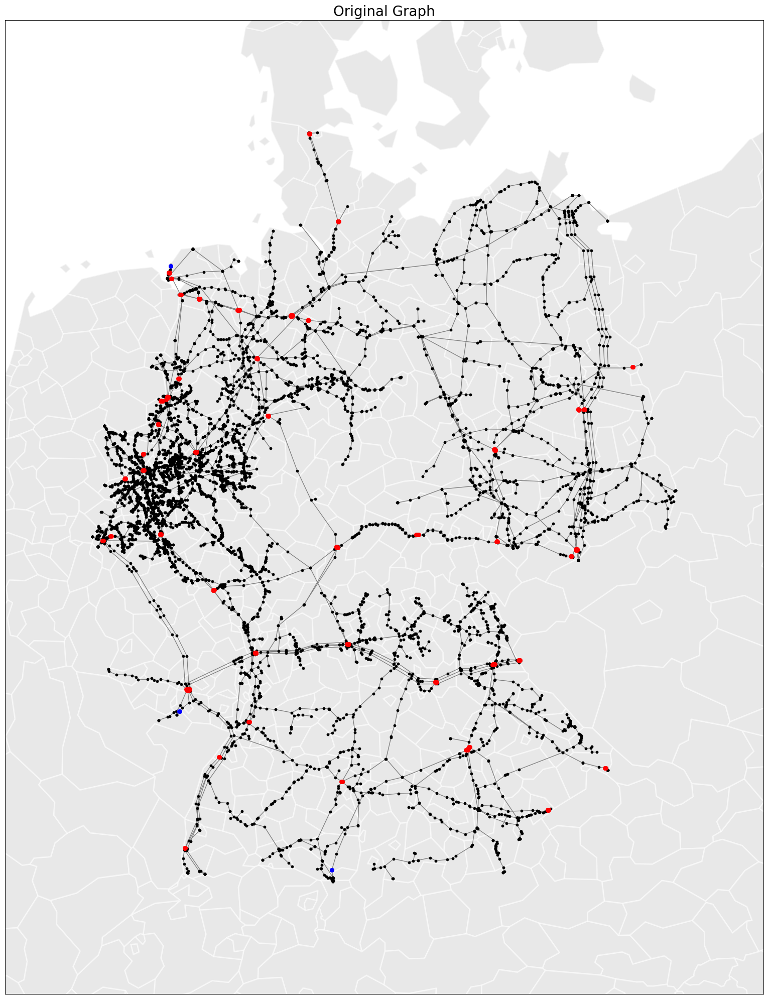

In [273]:
utils.plot_network(
	G=original,
	gdf=nuts3.to_crs("EPSG:3035"),
	node_size=10, 
	title="Original Graph"
)

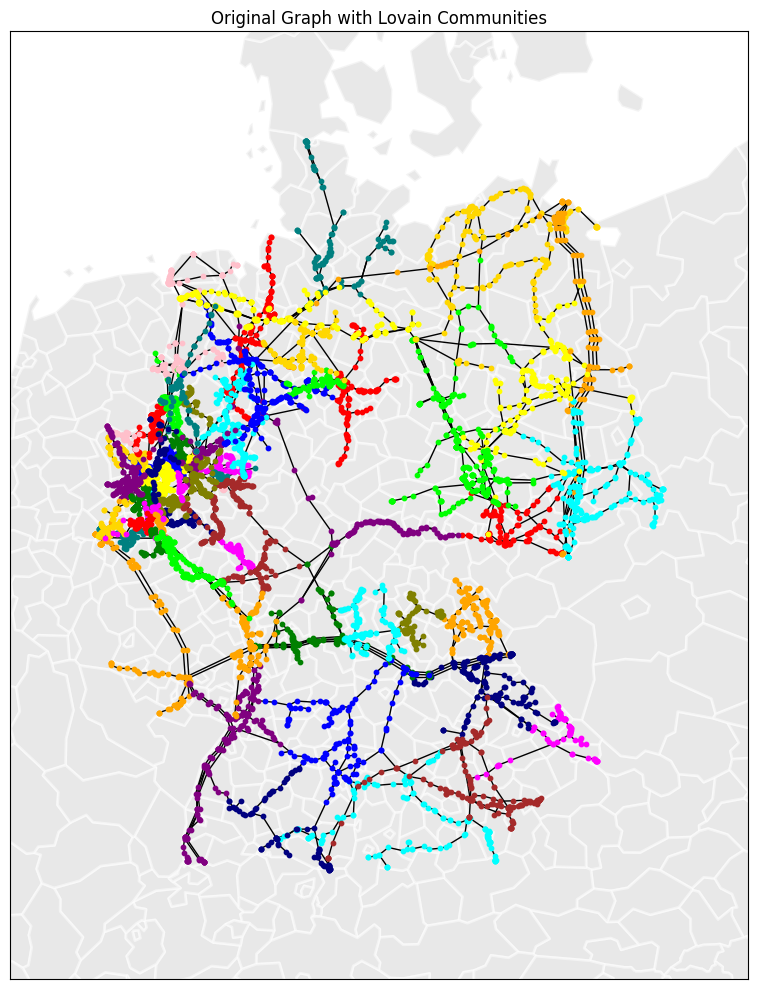

In [ ]:
utils.plot_network(
	graph=original,
	gdf=nuts3.to_crs("EPSG:3035"),
	clusters=louvain_results,
	node_size=10, 
	title="Original Graph with Lovain Communities"
)

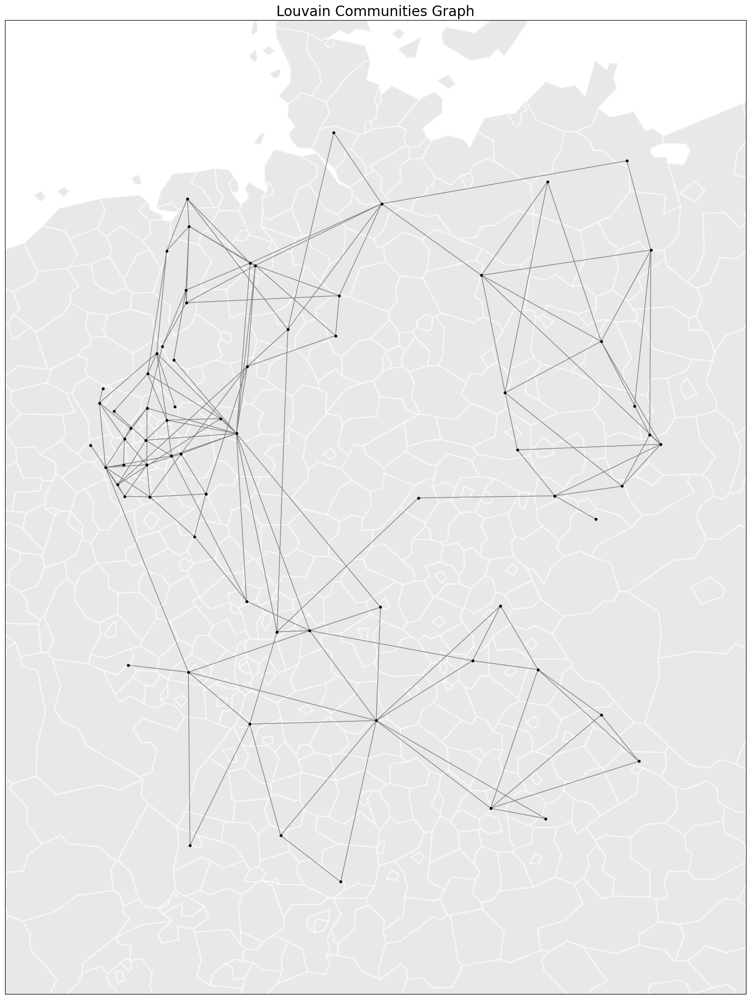

In [274]:
utils.plot_network(
	G=louvain_graph,
	gdf=nuts3.to_crs("EPSG:3035"),
	node_size=10, 
	title="Louvain Communities Graph"
)

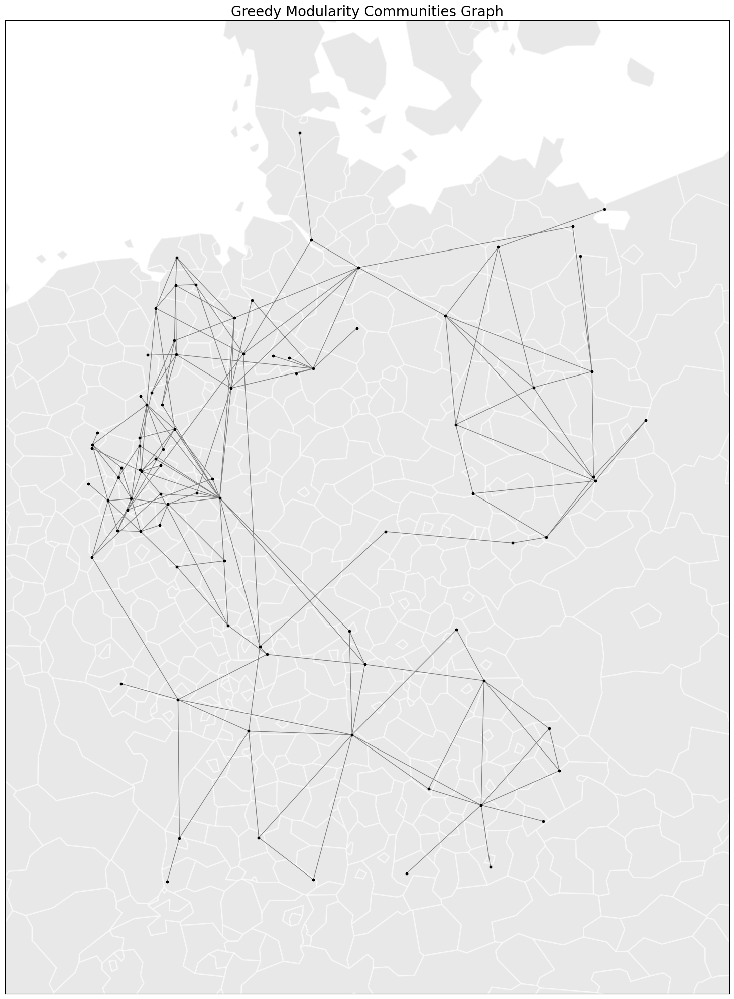

In [213]:
utils.plot_network(
	G=greedy_modularity_graph,
	gdf=nuts3.to_crs("EPSG:3035"),
	node_size=10, 
	title="Greedy Modularity Communities Graph"
)

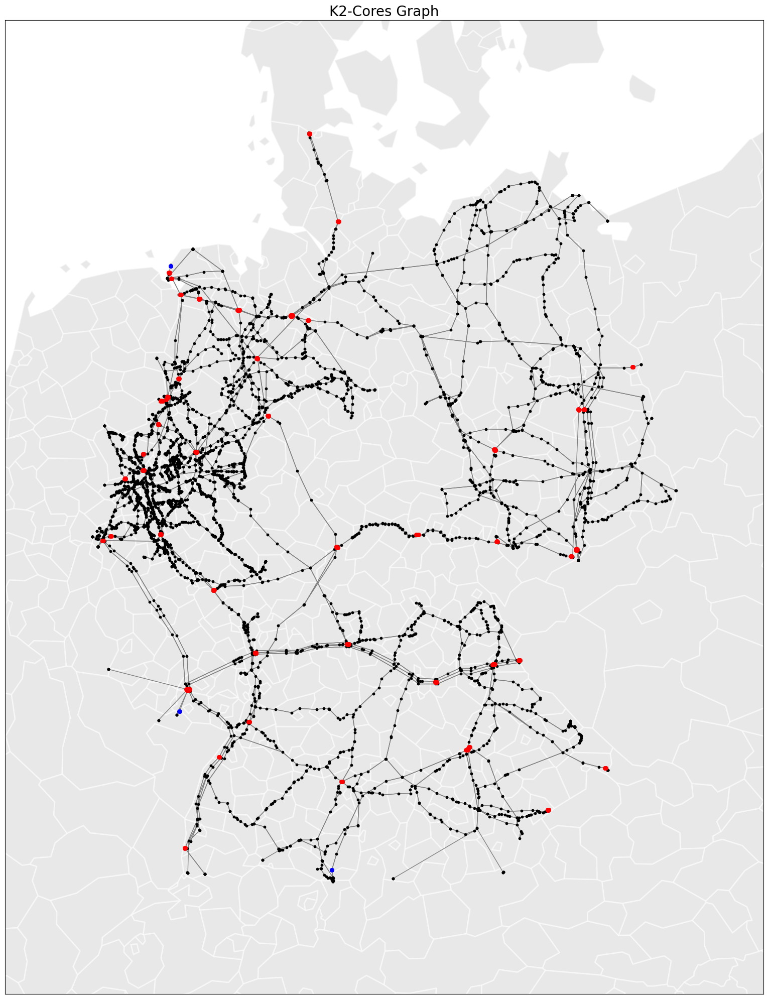

In [208]:
utils.plot_network(
	G=k2_cores,
	gdf=nuts3.to_crs("EPSG:3035"),
	node_size=10, 
	title="K2-Cores Graph"
	)

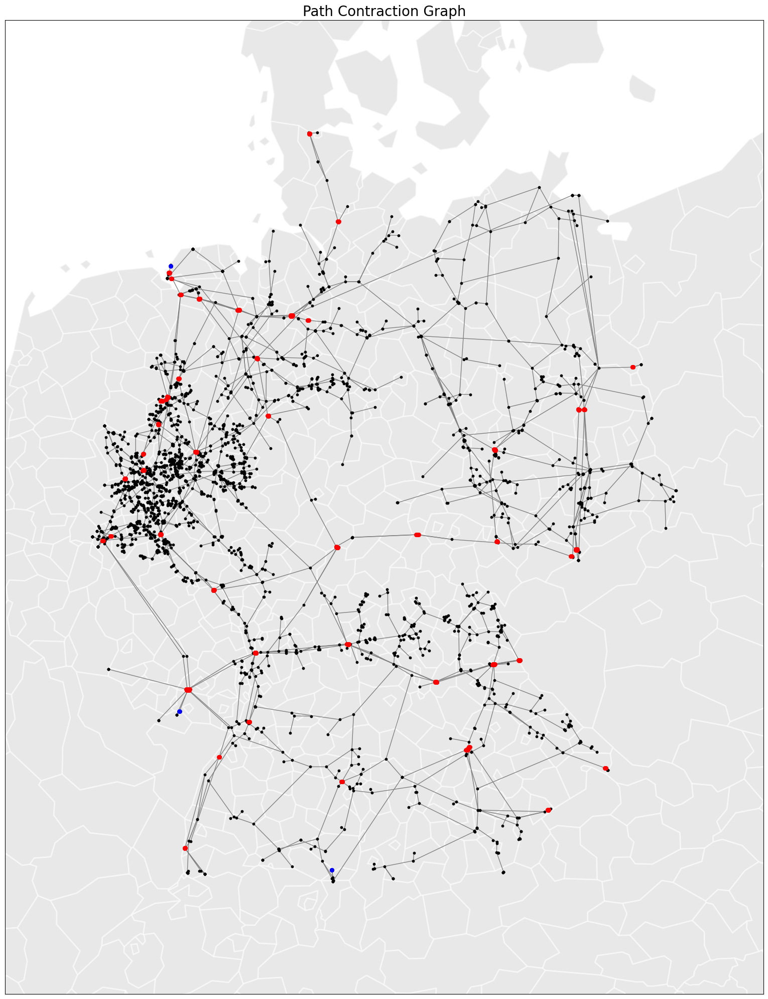

In [205]:
utils.plot_network(
	G=path_contraction,
	gdf=nuts3.to_crs("EPSG:3035"),
	node_size=10, 
	title="Path Contraction Graph"
	)

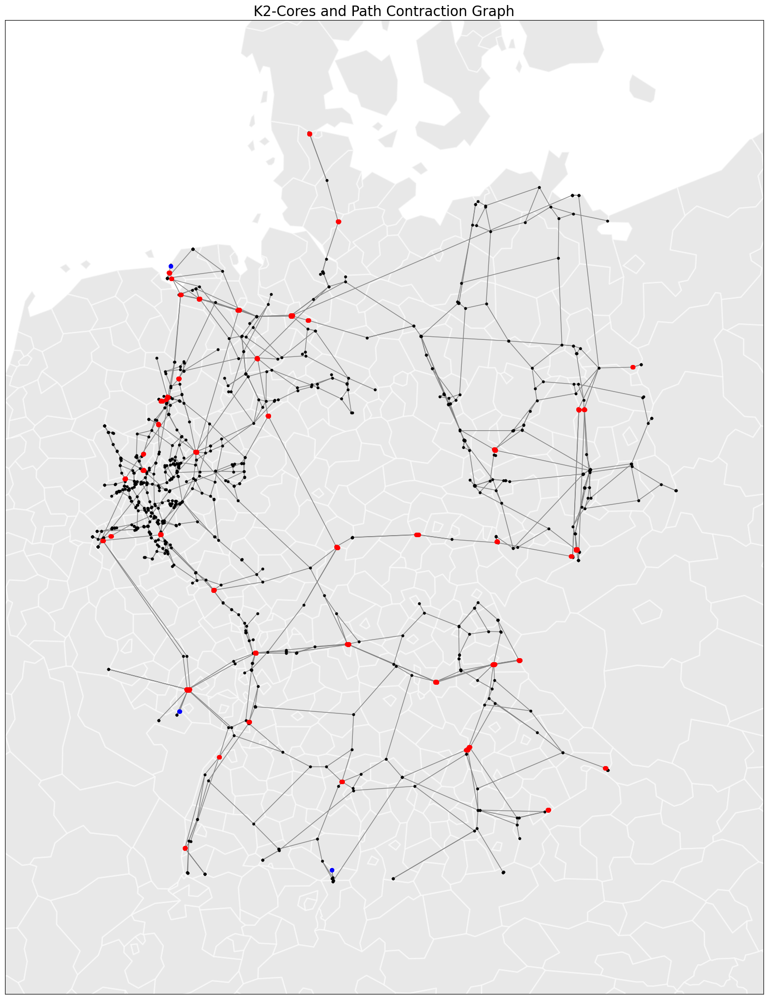

In [206]:
utils.plot_network(
	G=path_contraction_2,
	gdf=nuts3.to_crs("EPSG:3035"),
	node_size=10, 
	title="K2-Cores and Path Contraction Graph"
	)

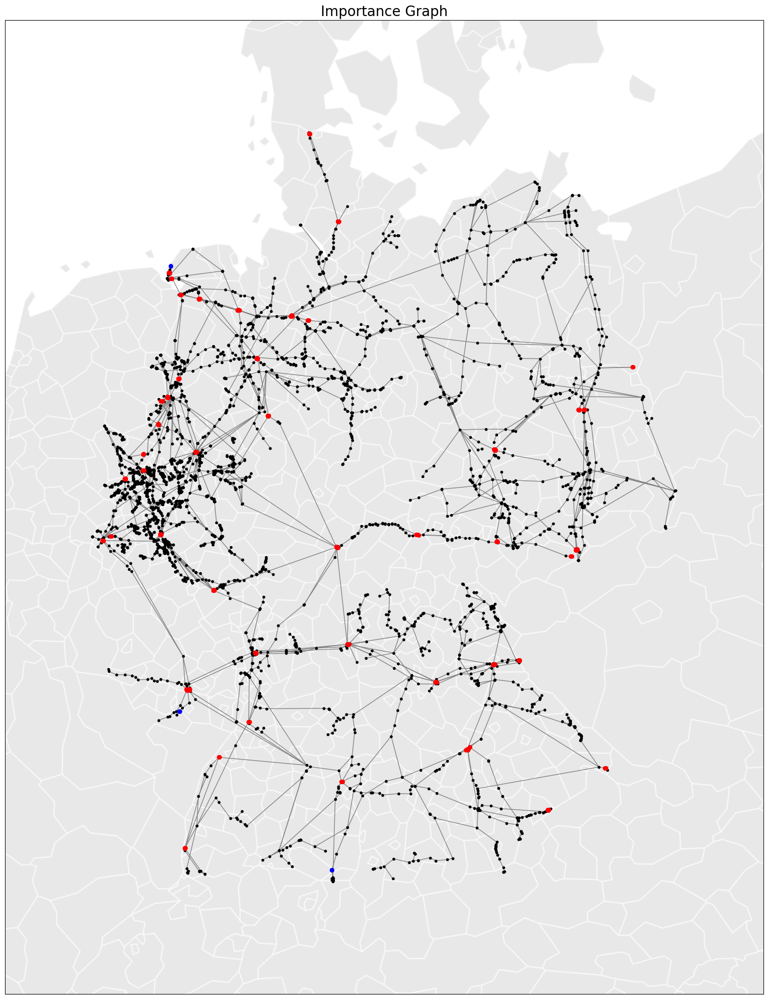

In [207]:
utils.plot_network(
	G=importance_graph,
	gdf=nuts3.to_crs("EPSG:3035"),
	node_size=10, 
	title="Importance Graph"
	)

# Test

In [ ]:
G = nx.read_gml("./data/de2025_simp.gml")

nodes = utils.graph_to_nodes_df(G)

In [ ]:
for node in enumerate(nodes):
		print(node)

(0, 'nodes')
(1, 'coord')
(2, 'node_type')


In [ ]:
k2_cores.nodes(data=True)

NodeDataView({'DSO_2165': {'coord': [4453548.157409, 3008771.494488], 'node_type': 'NO', 'x': 4453548.157409, 'y': 3008771.494488, 'geometry': <POINT (11.856 50.176)>, 'supply': -50.0}, 'DSO_1874': {'coord': [4456175.99051, 3012225.122382], 'node_type': 'NO', 'x': 4456175.99051, 'y': 3012225.122382, 'geometry': <POINT (11.894 50.207)>, 'supply': -50.0}, 'DSO_1870': {'coord': [4457384.46608, 3015160.098374], 'node_type': 'NO', 'x': 4457384.46608, 'y': 3015160.098374, 'geometry': <POINT (11.912 50.233)>, 'supply': -50.0}, 'X_1695': {'coord': [4478892.919205, 2996175.444245], 'node_type': 'NO', 'x': 4478892.919205, 'y': 2996175.444245, 'geometry': <POINT (12.205 50.057)>, 'supply': 0.0}, 'IND_0406': {'coord': [4476909.114047, 2998117.244073], 'node_type': 'NO', 'x': 4476909.114047, 'y': 2998117.244073, 'geometry': <POINT (12.178 50.075)>, 'supply': -50.0}, 'DSO_1866': {'coord': [4478486.128122, 2996876.176661], 'node_type': 'NO', 'x': 4478486.128122, 'y': 2996876.176661, 'geometry': <POIN

In [ ]:
nodes = [(node, data) for node, data in original.nodes(data=True) if node.startswith("CS")]
nodes

[('CS33-NY-01',
  {'coord': [4152024.670518, 3177329.118805],
   'node_type': 'NO',
   'x': 4152024.670518,
   'y': 3177329.118805,
   'geometry': <POINT (7.556 51.681)>,
   'supply': 0.0}),
 ('CS33-NY-00',
  {'coord': [4151884.304059, 3177738.395262],
   'node_type': 'NO',
   'x': 4151884.304059,
   'y': 3177738.395262,
   'geometry': <POINT (7.554 51.685)>,
   'supply': 0.0}),
 ('CS33-NY-03',
  {'coord': [4152305.354305, 3177735.192039],
   'node_type': 'NO',
   'x': 4152305.354305,
   'y': 3177735.192039,
   'geometry': <POINT (7.56 51.685)>,
   'supply': 0.0}),
 ('CS21-NY-03',
  {'coord': [4502131.693054, 2952152.87114],
   'node_type': 'NO',
   'x': 4502131.693054,
   'y': 2952152.87114,
   'geometry': <POINT (12.509 49.654)>,
   'supply': 0.0}),
 ('CS12-NY-01',
  {'coord': [4171936.594865, 3028162.03451],
   'node_type': 'NO',
   'x': 4171936.594865,
   'y': 3028162.03451,
   'geometry': <POINT (7.906 50.346)>,
   'supply': 0.0}),
 ('CS17-NY-01',
  {'coord': [4114614.487214, 3088

In [ ]:
degree = [(node, original.degree(node)) for node, data in nodes]
degree

[('CS33-NY-01', 2),
 ('CS33-NY-00', 2),
 ('CS33-NY-03', 2),
 ('CS21-NY-03', 2),
 ('CS12-NY-01', 2),
 ('CS17-NY-01', 2),
 ('CS17-NY-00', 2),
 ('CS22-NY-03', 2),
 ('CS11-NY-02', 2),
 ('CS15-NY-02', 2),
 ('CS04-NY-00', 2),
 ('CS27-CS', 6),
 ('CS33-NY-11', 2),
 ('CS24-CS', 8),
 ('CS25-CS', 8),
 ('CS35-CS', 4),
 ('CS33-NY-10', 2),
 ('CS30-CS', 11),
 ('CS23-CS', 11),
 ('CS29-CS', 8),
 ('CS28-CS', 5),
 ('CS00-CS', 2),
 ('CS04-NY-01', 2),
 ('CS47-CS', 9),
 ('CS02-CS', 2),
 ('CS41-CS', 4),
 ('CS42-CS', 5),
 ('CS38-CS', 9),
 ('CS39-CS', 6),
 ('CS44-CS', 5),
 ('CS43-CS', 2),
 ('CS40-CS', 4),
 ('CS13-CS', 4),
 ('CS11-CS', 3),
 ('CS22-CS', 9),
 ('CS18-CS', 7),
 ('CS15-CS', 3),
 ('CS05-CS', 2),
 ('CS16-CS', 7),
 ('CS04-CS', 2),
 ('CS20-CS', 2),
 ('CS26-CS', 4),
 ('CS31-CS', 4),
 ('CS34-CS', 6),
 ('CS16-NY-01', 2),
 ('CS36-CS', 9),
 ('CS14-CS', 2),
 ('CS19-CS', 6),
 ('CS07-CS', 5),
 ('CS03-CS', 2),
 ('CS16-NY-06', 2),
 ('CS08-CS', 2),
 ('CS10-CS', 2),
 ('CS32-CS', 11),
 ('CS09-CS', 2),
 ('CS48-CS', 5

In [ ]:
k2_cores_sim.res_compressor.reset_index(drop=True)

,deltap_bar,p_from_bar,p_to_bar,t_from_k,t_to_k,t_outlet_k,mdot_from_kg_per_s,mdot_to_kg_per_s,vdot_norm_m3_per_s,normfactor_from,normfactor_to,compr_power_mw
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
original.nodes(data=True)

NodeDataView({'X_1693': {'coord': [4451976.104649, 3022833.492192], 'node_type': 'NO', 'x': 4451976.104649, 'y': 3022833.492192, 'geometry': <POINT (11.838 50.303)>, 'supply': 0.0}, 'DSO_1871': {'coord': [4454335.933506, 3018632.118088], 'node_type': 'NO', 'x': 4454335.933506, 'y': 3018632.118088, 'geometry': <POINT (11.87 50.265)>, 'supply': -0.0}, 'DSO_2165': {'coord': [4453548.157409, 3008771.494488], 'node_type': 'NO', 'x': 4453548.157409, 'y': 3008771.494488, 'geometry': <POINT (11.856 50.176)>, 'supply': -0.36556566480905966}, 'DSO_1874': {'coord': [4456175.99051, 3012225.122382], 'node_type': 'NO', 'x': 4456175.99051, 'y': 3012225.122382, 'geometry': <POINT (11.894 50.207)>, 'supply': -0.8889832929166654}, 'DSO_1870': {'coord': [4457384.46608, 3015160.098374], 'node_type': 'NO', 'x': 4457384.46608, 'y': 3015160.098374, 'geometry': <POINT (11.912 50.233)>, 'supply': -0.302730630832476}, 'DSO_1869': {'coord': [4457512.658531, 3015251.232525], 'node_type': 'NO', 'x': 4457512.658531

In [ ]:
original.to_undirected()

In [ ]:
k2_cores

In [35]:
for simp_node, simp_data in greedy_modularity_graph.nodes(data=True):
    total_cluster_supply = 0
    # Look inside the cluster to find the original nodes
    for orig_node_id in simp_data['original_nodes']:
        # Get the supply value from the original graph's node
        total_cluster_supply += original.nodes[orig_node_id].get('supply', 0)
    
    # Assign the summed value to the cluster node
    simp_data['supply'] = total_cluster_supply


In [60]:
gpd.GeoDataFrame(utils.graph_to_nodes_df(original))

,nodes,coord,node_type,supply
0,X_1693,"[4451976.104649, 3022833.492192]",NO,0.000000
1,DSO_1871,"[4454335.933506, 3018632.118088]",NO,-0.044353
2,DSO_2165,"[4453548.157409, 3008771.494488]",NO,-0.228967
3,DSO_1874,"[4456175.99051, 3012225.122382]",NO,-0.513222
4,DSO_1870,"[4457384.46608, 3015160.098374]",NO,-0.328399
...,...,...,...,...
7891,X_2517,"[4235987.502898, 3416046.023697]",NO,0.000000
7892,X_2527,"[4128939.161654, 3055842.00448]",NO,0.000000
7893,X_2526,"[4128937.560941, 3055833.157972]",NO,0.000000
7894,DSO_2575,"[4126570.937362, 3058268.010563]",NO,-0.153558


In [304]:
k2_cores.nodes(data=True)

NodeDataView({'DSO_2165': {'coord': [4453548.157409, 3008771.494488], 'node_type': 'NO', 'supply': -0.9184225243809383}, 'DSO_1874': {'coord': [4456175.99051, 3012225.122382], 'node_type': 'NO', 'supply': -0.8463315697372134}, 'DSO_1870': {'coord': [4457384.46608, 3015160.098374], 'node_type': 'NO', 'supply': -1.2996401162537927}, 'X_1695': {'coord': [4478892.919205, 2996175.444245], 'node_type': 'NO', 'supply': 0.0}, 'IND_0406': {'coord': [4476909.114047, 2998117.244073], 'node_type': 'NO', 'supply': -0.303501132169006}, 'DSO_1866': {'coord': [4478486.128122, 2996876.176661], 'node_type': 'NO', 'supply': -0.3036034102970447}, 'DSO_1867': {'coord': [4478420.694777, 2996927.961215], 'node_type': 'NO', 'supply': -0.30352870433693263}, 'DSO_2390': {'coord': [4145230.360283, 3161410.029485], 'node_type': 'NO', 'supply': -2.6221910046723624}, 'X_1697': {'coord': [4136919.353905, 3165120.146394], 'node_type': 'NO', 'supply': 0.0}, 'X_1694': {'coord': [4136550.182275, 3165925.591494], 'node_t

In [157]:
len(original.edges())

17310

In [156]:
len(original.nodes())

7896

In [155]:
len(mst.edges())

7895

In [89]:
path_contraction.edges(data=True)

OutEdgeDataView([('DSO_2627', 'X_2984', {'L': 1.119, 'DN': 200.0, 'Pmax': 100.0, 'capacity': 8.58636910976685, 'norm_capacity': 0.016859704440062857}), ('CS19-NY-03', 'CS19-CS-IN', {'L': 0.01, 'DN': 1200, 'Pmax': 120, 'capacity': 877.3255825298124, 'norm_capacity': 0.7455473095296218}), ('CS19-NY-03', 'CS19-CS-OUT', {'L': 0.01, 'DN': 1200, 'Pmax': 120, 'capacity': 877.3255825298124, 'norm_capacity': 0.7455473095296218}), ('CS19-NY-03', 'X_0793', {'edge_name': 'X_0793^CS19-NY-03_contracted', 'edge_type': 'pipe_contracted', 'L': 48.458, 'Pmax': 100.0, 'DN': 300.0, 'capacity': 23.365048477374696, 'norm_capacity': 0.029255876166182096}), ('IC_AT06-IN', 'CS35-NY-02', {'edge_name': 'CS35-NY-02^IC_AT06-IN_contracted', 'edge_type': 'pipe_contracted', 'L': 0.099, 'Pmax': 100.0, 'DN': 700.0, 'capacity': 204.422061593112, 'norm_capacity': 0.1811242380795102}), ('IND_0254', 'DSO_2819', {'L': 7.154, 'DN': 400.0, 'Pmax': 100.0, 'capacity': 49.43940021740342, 'norm_capacity': 0.05112671683988098}), (